# Task 0: Capture Your Own Image Set

## Objective

Capture a set of original images and a short video using a phone or laptop webcam. These media files will be used throughout the remaining OpenCV onboarding tasks.

## Images and Video Captured

The following original captures were taken and stored in the `raw_captures/` directory.

| File Name | Description | Purpose |
|-----------|-------------|---------|
| `normal_light.jpg` | Photo of myself in normal indoor lighting | Used for image processing and face-related tasks |
| `low_light.jpg` | Same scene captured under low lighting | Used for low-light enhancement and color space analysis |
| `objects.jpg` | Three small objects (pen, key, coin) placed on a desk | Used for contour detection, segmentation, and object counting |
| `document.jpg` | Printed page captured at a slight angle | Used for perspective transformation and document scanning |
| `moving_object.mp4` | 15–20 second video of an object moving across the frame | Used for video processing and motion analysis |

## Directory Structure

```text
onboarding-opencv/
└── Goutham/
    ├── raw_captures/
    │   ├── normal_light.jpg
    │   ├── low_light.jpg
    │   ├── objects.jpg
    │   ├── document.jpg
    │   └── moving_object.mp4
    └── task0.ipynb
```

## Observations

- All images were captured without any editing or preprocessing.
- The normal-light and low-light images contain the same scene, making them suitable for comparing image quality under different illumination conditions.
- The desk image contains multiple distinct objects separated from each other, which will help in contour extraction and object detection tasks.
- The document image was intentionally captured at a slight angle to demonstrate perspective distortion and its correction in later tasks.
- The video contains smooth motion of an object across the frame, making it suitable for frame extraction, motion detection, and tracking exercises.

## Learning Outcome

This task establishes a custom dataset for the onboarding exercises. Using self-captured images ensures that subsequent image processing algorithms are applied to real-world data rather than preprocessed or publicly available examples, providing a better understanding of OpenCV's capabilities and practical challenges.

# Task 1. Color Space Conversion  

Using your low-light photo, convert it to Grayscale, HSV, and RGB (remember OpenCV loads as BGR by default). Display all versions side by side. 

Then, looking specifically at your own photo, note which HSV channel best preserves detail in the darkest part of the frame, and why you think that's the case for this particular shot.

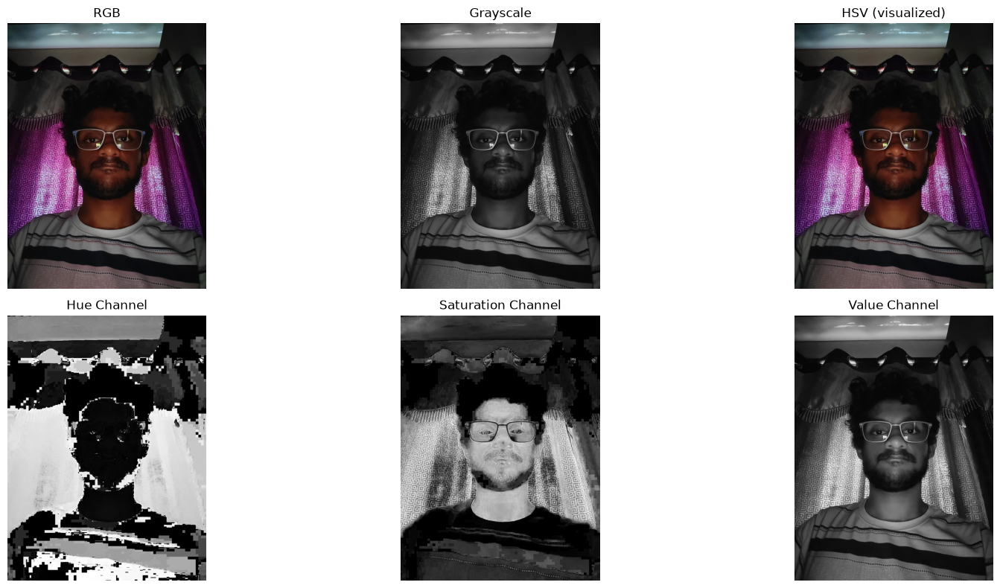

(np.float64(-0.5), np.float64(1200.5), np.float64(1599.5), np.float64(-0.5))

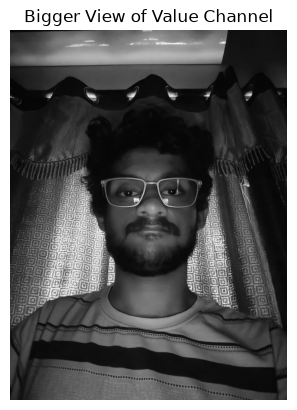

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# -----------------------------
# Create output directory
# -----------------------------
os.makedirs("outputs", exist_ok=True)

# -----------------------------
# Read image (OpenCV loads as BGR)
# -----------------------------
img_bgr = cv2.imread("raw_captures/bad_lighting.jpeg")

if img_bgr is None:
    raise FileNotFoundError("Image not found!")

# -----------------------------
# Convert to different color spaces
# -----------------------------
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)

# HSV channels
H, S, V = cv2.split(hsv)

# -----------------------------
# Display
# -----------------------------
plt.figure(figsize=(18,8))

plt.subplot(2,3,1)
plt.imshow(rgb)
plt.title("RGB")
plt.axis("off")

plt.subplot(2,3,2)
plt.imshow(gray, cmap="gray")
plt.title("Grayscale")
plt.axis("off")

plt.subplot(2,3,3)
plt.imshow(cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB))
plt.title("HSV (visualized)")
plt.axis("off")

plt.subplot(2,3,4)
plt.imshow(H, cmap="gray")
plt.title("Hue Channel")
plt.axis("off")

plt.subplot(2,3,5)
plt.imshow(S, cmap="gray")
plt.title("Saturation Channel")
plt.axis("off")

plt.subplot(2,3,6)
plt.imshow(V, cmap="gray")
plt.title("Value Channel")
plt.axis("off")

plt.tight_layout()

plt.savefig("outputs/task1_color_spaces.png", dpi=300)
plt.show()

plt.subplot(1,1,1)
plt.imshow(V, cmap="gray")
plt.title("Bigger View of Value Channel")
plt.axis("off")

- The V (Value) channel represents the brightness of each pixel.
Even in dark scenes, it records subtle intensity differences, allowing edges and object shapes to remain visible.
- The Hue (H) channel becomes unreliable in very dark regions because color information is difficult to estimate when little light reaches the camera sensor.
- The Saturation (S) channel often contains very low values in dim lighting since colors become less vivid and more desaturated.

- Therefore, for this low-light photograph, the Value channel best preserves detail because it directly represents luminance, whereas Hue and Saturation depend on reliable color information that is degraded under low illumination.

# Task 2. Image Blending via Feature Matching   

Using your normal-light and low-light photos of the same scene, detect keypoints and descriptors in both with ORB, then match them with a brute-force (or FLANN) matcher. Use the good matches to estimate a homography with cv2.findHomography() (RANSAC), and warp the low-light photo onto the normal-light photo's plane with cv2.warpPerspective(). 

Once aligned, blend the two images with cv2.addWeighted() using at least two different weight combinations. Report how many good matches you found and comment on how well the homography aligned the two shots. 

Keypoints in normal image : 500
Keypoints in low-light image : 500
Good Matches : 26

Homography Matrix

[[ 9.96449449e-01  1.73078217e-03  6.62250699e+00]
 [ 3.45356223e-03  1.00181015e+00 -1.37859084e+00]
 [ 2.09039046e-06  2.22878679e-06  1.00000000e+00]]


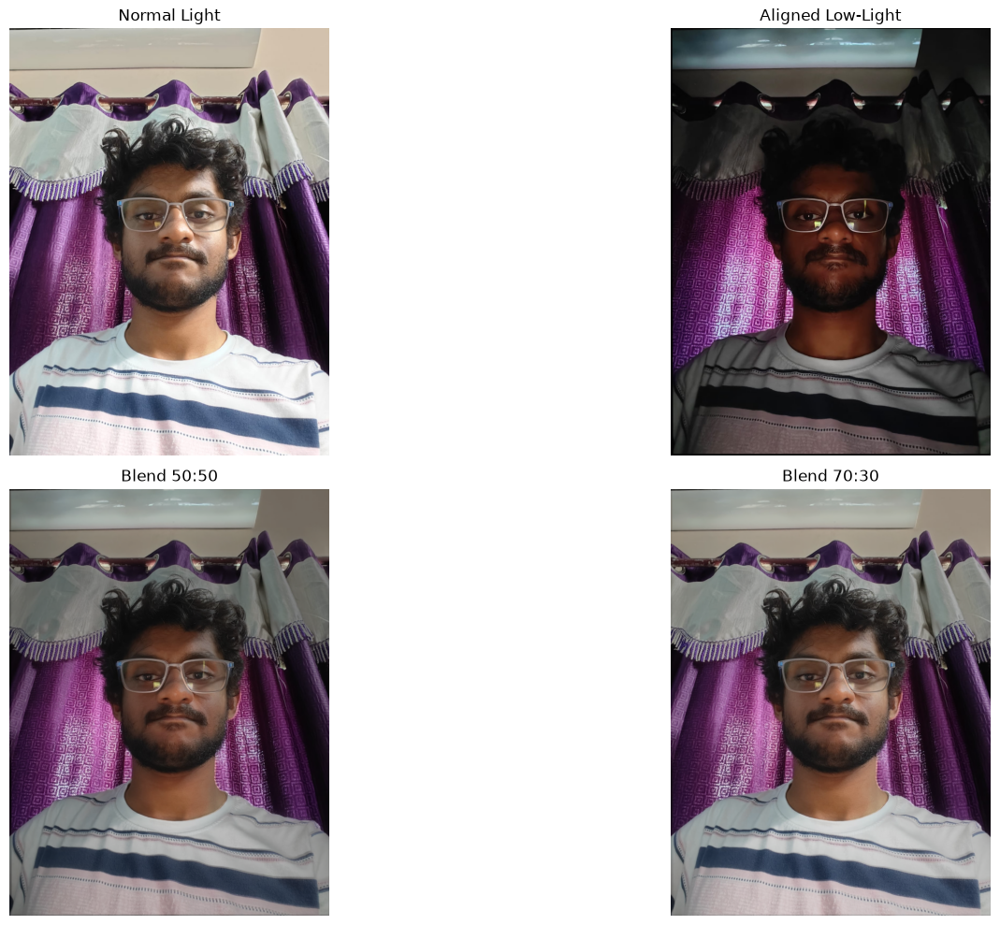

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# ----------------------------------------------------
# Create output folder
# ----------------------------------------------------
os.makedirs("outputs", exist_ok=True)

# ----------------------------------------------------
# Load images
# ----------------------------------------------------
img1 = cv2.imread("raw_captures/good_lighting.jpeg")
img2 = cv2.imread("raw_captures/bad_lighting.jpeg")

if img1 is None or img2 is None:
    raise FileNotFoundError("Images not found!")

# Convert to grayscale
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# ----------------------------------------------------
# ORB Feature Detection
# ----------------------------------------------------
orb = cv2.ORB_create(nfeatures=500)

kp1, des1 = orb.detectAndCompute(gray1, None)
kp2, des2 = orb.detectAndCompute(gray2, None)

print("Keypoints in normal image :", len(kp1))
print("Keypoints in low-light image :", len(kp2))

# ----------------------------------------------------
# Brute Force Matcher
# ----------------------------------------------------
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

matches = bf.knnMatch(des1, des2, k=2)

# Lowe Ratio Test
good_matches = []

for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

print("Good Matches :", len(good_matches))

# ----------------------------------------------------
# Draw matches
# ----------------------------------------------------
match_img = cv2.drawMatches(
    img1,
    kp1,
    img2,
    kp2,
    good_matches,
    None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

cv2.imwrite("outputs/good_matches.jpg", match_img)

# ----------------------------------------------------
# Homography
# ----------------------------------------------------
MIN_MATCH_COUNT = 10

if len(good_matches) >= MIN_MATCH_COUNT:

    src_pts = np.float32(
        [kp1[m.queryIdx].pt for m in good_matches]
    ).reshape(-1,1,2)

    dst_pts = np.float32(
        [kp2[m.trainIdx].pt for m in good_matches]
    ).reshape(-1,1,2)

    H, mask = cv2.findHomography(
        dst_pts,
        src_pts,
        cv2.RANSAC,
        5.0
    )

    print("\nHomography Matrix\n")
    print(H)

    aligned = cv2.warpPerspective(
        img2,
        H,
        (img1.shape[1], img1.shape[0])
    )

    cv2.imwrite("outputs/aligned_image.jpg", aligned)

    # ------------------------------------------------
    # Blending
    # ------------------------------------------------
    blend1 = cv2.addWeighted(
        img1,
        0.5,
        aligned,
        0.5,
        0
    )

    blend2 = cv2.addWeighted(
        img1,
        0.7,
        aligned,
        0.3,
        0
    )

    cv2.imwrite("outputs/blend_50_50.jpg", blend1)
    cv2.imwrite("outputs/blend_70_30.jpg", blend2)

    # ------------------------------------------------
    # Display
    # ------------------------------------------------
    plt.figure(figsize=(18,10))

    plt.subplot(2,2,1)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.title("Normal Light")
    plt.axis("off")

    plt.subplot(2,2,2)
    plt.imshow(cv2.cvtColor(aligned, cv2.COLOR_BGR2RGB))
    plt.title("Aligned Low-Light")
    plt.axis("off")

    plt.subplot(2,2,3)
    plt.imshow(cv2.cvtColor(blend1, cv2.COLOR_BGR2RGB))
    plt.title("Blend 50:50")
    plt.axis("off")

    plt.subplot(2,2,4)
    plt.imshow(cv2.cvtColor(blend2, cv2.COLOR_BGR2RGB))
    plt.title("Blend 70:30")
    plt.axis("off")

    plt.tight_layout()
    plt.savefig("outputs/task2_results.png", dpi=300)
    plt.show()

else:

    print("\nNot enough matches found.")

# Task 3. Geometric Transformations   

Pick a personal reference number: the last 2 digits of your employee ID (or, if you don't have one yet, the last 2 digits of your phone number). Compute angle = (your number) x 3 degrees and scale = 1 + (last digit of your number / 10). 

Apply translation, this rotation, this scale factor, and one affine transform to your objects photo. State the reference number and computed values explicitly in your notebook so your mentor can double check them.

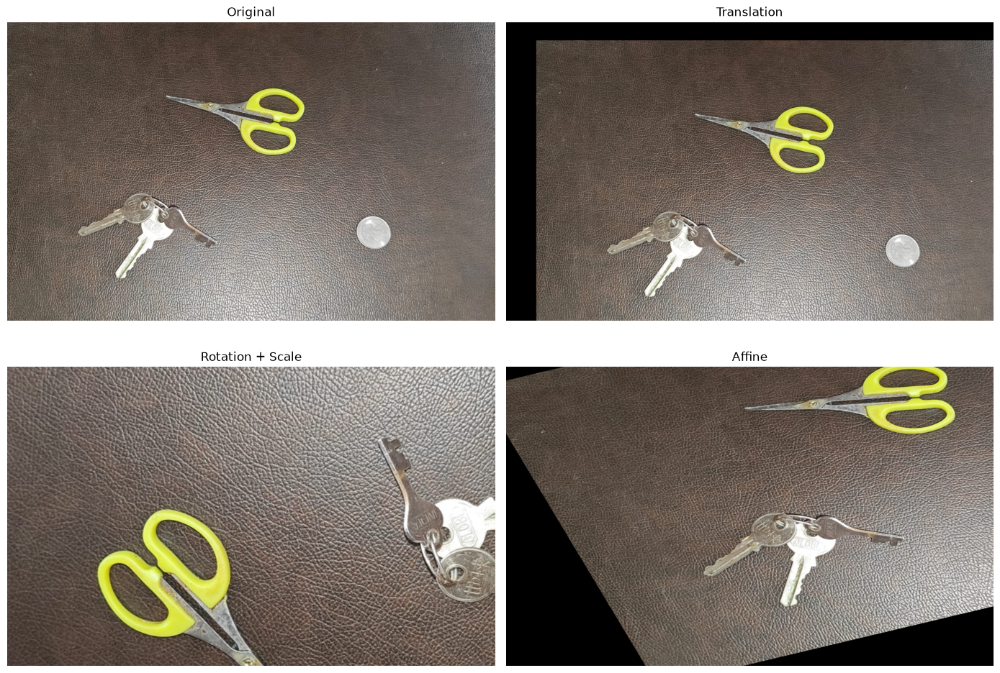

Translation Matrix

[[  1.   0. 100.]
 [  0.   1.  60.]]

Rotation Matrix

[[-1.59347408e+00  1.03481417e+00  1.56668551e+03]
 [-1.03481417e+00 -1.59347408e+00  2.10124711e+03]]

Affine Matrix

[[  1.4          0.6        -90.        ]
 [ -0.33333333   1.          66.66666667]]


In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# -----------------------------------
# Create output directory
# -----------------------------------
os.makedirs("outputs", exist_ok=True)

# -----------------------------------
# Read image
# -----------------------------------
img = cv2.imread("raw_captures/objects.jpeg")

if img is None:
    raise FileNotFoundError("Image not found.")

h, w = img.shape[:2]

# =====================================================
# 1. Translation
# =====================================================
tx = 100      # pixels right
ty = 60       # pixels down

translation_matrix = np.float32([
    [1, 0, tx],
    [0, 1, ty]
])

translated = cv2.warpAffine(img, translation_matrix, (w, h))

# =====================================================
# 2. Rotation + Scale
# =====================================================
angle = 147
scale = 1.9

center = (w//2, h//2)

rotation_matrix = cv2.getRotationMatrix2D(center, angle, scale)

rotated_scaled = cv2.warpAffine(
    img,
    rotation_matrix,
    (w, h)
)

# =====================================================
# 3. Affine Transform
# =====================================================

pts1 = np.float32([
    [50, 50],
    [200, 50],
    [50, 200]
])

pts2 = np.float32([
    [10, 100],
    [220, 50],
    [100, 250]
])

affine_matrix = cv2.getAffineTransform(pts1, pts2)

affine = cv2.warpAffine(
    img,
    affine_matrix,
    (w, h)
)

# =====================================================
# Save
# =====================================================

cv2.imwrite("outputs/translated.jpg", translated)
cv2.imwrite("outputs/rotated_scaled.jpg", rotated_scaled)
cv2.imwrite("outputs/affine.jpg", affine)

# =====================================================
# Display
# =====================================================

plt.figure(figsize=(14,10))

images = [
    img,
    translated,
    rotated_scaled,
    affine
]

titles = [
    "Original",
    "Translation",
    "Rotation + Scale",
    "Affine"
]

for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis("off")

plt.tight_layout()

plt.savefig("outputs/task3_transformations.png", dpi=300)
plt.show()

# =====================================================
# Print matrices
# =====================================================

print("Translation Matrix\n")
print(translation_matrix)

print("\nRotation Matrix\n")
print(rotation_matrix)

print("\nAffine Matrix\n")
print(affine_matrix)

# Task 4. Noise and Filtering   

Add Gaussian noise (mean=0, sigma=25) to your text-page photo. Before running any filter, jot down a quick prediction: which of Mean/Gaussian/Median/Bilateral do you expect to preserve text edges best, and why? Then run all four and compare against your prediction. If you were off, note what you misunderstood; that's normal and useful for your mentor to see.

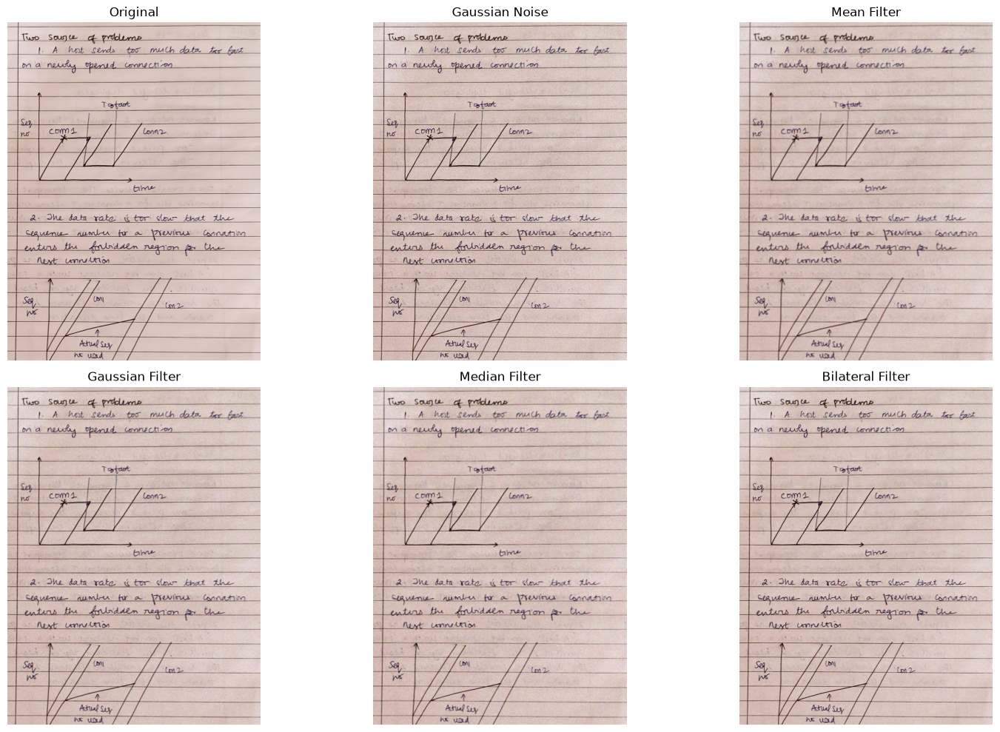

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# ----------------------------------------
# Create output directory
# ----------------------------------------
os.makedirs("outputs", exist_ok=True)

# ----------------------------------------
# Load image
# ----------------------------------------
img = cv2.imread("raw_captures/document.jpeg")

if img is None:
    raise FileNotFoundError("document.jpeg not found.")

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# ----------------------------------------
# Add Gaussian Noise
# mean = 0, sigma = 25
# ----------------------------------------
mean = 0
sigma = 25

noise = np.random.normal(mean, sigma, img.shape).astype(np.float32)

noisy = img.astype(np.float32) + noise
noisy = np.clip(noisy, 0, 255).astype(np.uint8)

# ----------------------------------------
# Apply Filters
# ----------------------------------------

# Mean Filter
mean_filtered = cv2.blur(noisy, (5, 5))

# Gaussian Filter
gaussian_filtered = cv2.GaussianBlur(noisy, (5, 5), 0)

# Median Filter
median_filtered = cv2.medianBlur(noisy, 5)

# Bilateral Filter
bilateral_filtered = cv2.bilateralFilter(
    noisy,
    d=9,
    sigmaColor=75,
    sigmaSpace=75
)

# ----------------------------------------
# Save Images
# ----------------------------------------
cv2.imwrite(
    "outputs/noisy_document.jpg",
    cv2.cvtColor(noisy, cv2.COLOR_RGB2BGR)
)

cv2.imwrite(
    "outputs/mean_filter.jpg",
    cv2.cvtColor(mean_filtered, cv2.COLOR_RGB2BGR)
)

cv2.imwrite(
    "outputs/gaussian_filter.jpg",
    cv2.cvtColor(gaussian_filtered, cv2.COLOR_RGB2BGR)
)

cv2.imwrite(
    "outputs/median_filter.jpg",
    cv2.cvtColor(median_filtered, cv2.COLOR_RGB2BGR)
)

cv2.imwrite(
    "outputs/bilateral_filter.jpg",
    cv2.cvtColor(bilateral_filtered, cv2.COLOR_RGB2BGR)
)

# ----------------------------------------
# Display
# ----------------------------------------

images = [
    img,
    noisy,
    mean_filtered,
    gaussian_filtered,
    median_filtered,
    bilateral_filtered
]

titles = [
    "Original",
    "Gaussian Noise",
    "Mean Filter",
    "Gaussian Filter",
    "Median Filter",
    "Bilateral Filter"
]

plt.figure(figsize=(16,10))

for i in range(len(images)):
    plt.subplot(2,3,i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis("off")

plt.tight_layout()
plt.savefig("outputs/task4_results.png", dpi=300)
plt.show()

The Bilateral Filter to preserve the text edges best. Unlike Mean and Gaussian filters, which smooth all pixels uniformly and can blur character boundaries, the bilateral filter considers both spatial proximity and pixel intensity differences. This helps reduce Gaussian noise while preserving strong edges such as the boundaries of printed or handwritten text.

# Task 5. Edge and Contour Detection  

Part A: Run Canny edge detection on your objects photo. Count by eye how many of your real objects come through as clean, closed contours at thresholds (50, 150). Tune the thresholds until the count matches what you actually placed in frame, and note the final values and how many tries it took. 

Part B: On the same photo, auto-count the objects using cv2.findContours(). Compare that count to the real count (you placed them, so you know the answer). If they don't match, investigate why (shadows, touching objects, reflections) and fix it. Submit the annotated image (with contours drawn) next to the raw photo.

Objects detected: 3


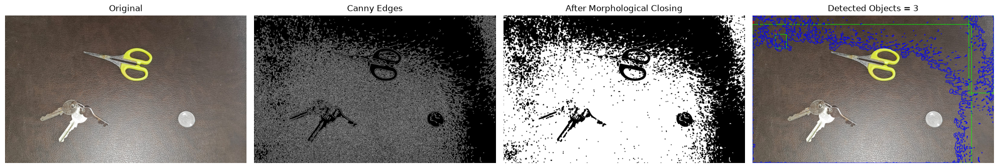

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# ---------------------------------------
# Create output folder
# ---------------------------------------
os.makedirs("outputs", exist_ok=True)

# ---------------------------------------
# Read image
# ---------------------------------------
img = cv2.imread("raw_captures/objects.jpeg")

if img is None:
    raise FileNotFoundError("objects.jpeg not found.")

original = img.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# ---------------------------------------
# Slight blur before edge detection
# ---------------------------------------
blur = cv2.GaussianBlur(gray, (5,5), 0)

# ---------------------------------------
# Canny Edge Detection
# (Initial thresholds)
# ---------------------------------------
low_threshold = 50
high_threshold = 100

edges = cv2.Canny(
    blur,
    low_threshold,
    high_threshold
)

cv2.imwrite("outputs/canny_edges.jpg", edges)

# ---------------------------------------
# Morphological Closing
# Helps close broken edges
# ---------------------------------------
kernel = np.ones((3,3), np.uint8)

closed = cv2.morphologyEx(
    edges,
    cv2.MORPH_CLOSE,
    kernel,
    iterations=2
)

# ---------------------------------------
# Find Contours
# ---------------------------------------
contours, hierarchy = cv2.findContours(
    closed,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)

annotated = original.copy()

count = 0

MIN_AREA = 800

for c in contours:

    area = cv2.contourArea(c)

    if area > MIN_AREA:

        count += 1

        x,y,w,h = cv2.boundingRect(c)

        cv2.rectangle(
            annotated,
            (x,y),
            (x+w,y+h),
            (0,255,0),
            2
        )

        cv2.putText(
            annotated,
            str(count),
            (x,y-8),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            (0,0,255),
            2
        )

cv2.drawContours(
    annotated,
    contours,
    -1,
    (255,0,0),
    2
)

print("Objects detected:", count)

cv2.imwrite("outputs/annotated_objects.jpg", annotated)

plt.figure(figsize=(20,5))

plt.subplot(1,4,1)
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis("off")

plt.subplot(1,4,2)
plt.imshow(edges, cmap="gray")
plt.title("Canny Edges")
plt.axis("off")

plt.subplot(1,4,3)
plt.imshow(closed, cmap="gray")
plt.title("After Morphological Closing")
plt.axis("off")

plt.subplot(1,4,4)
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.title(f"Detected Objects = {count}")
plt.axis("off")

plt.tight_layout()
plt.savefig("outputs/task5_results.png", dpi=300)
plt.show()

# Task 6. Thresholding and Morphology   

On your text-page photo, apply Otsu's thresholding, then use morphological closing to clean up the binary text. Show a before/after crop of one word, and note what kernel size worked and why a smaller or larger one didn't, given your image's resolution and font size.

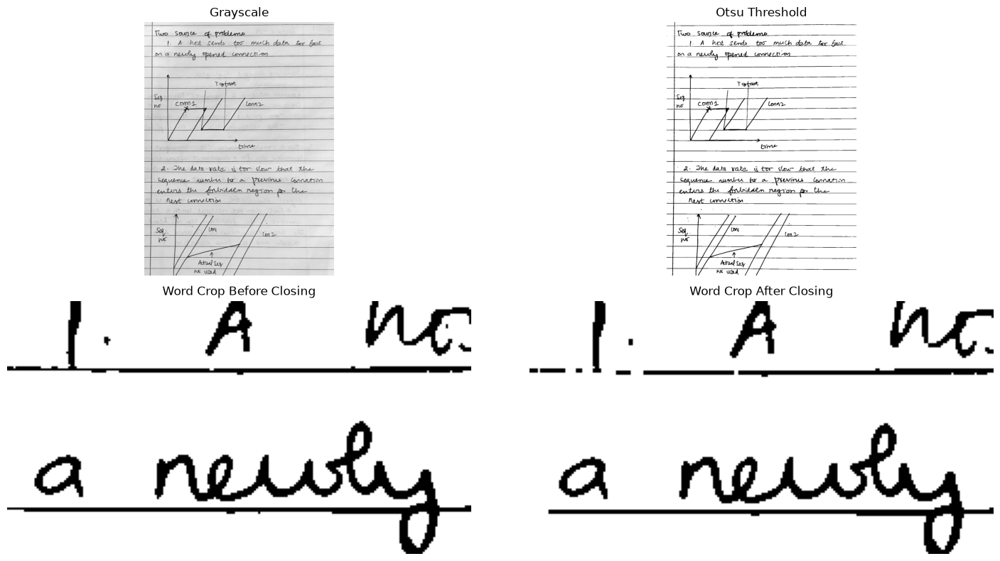

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# ---------------------------------------
# Create output folder
# ---------------------------------------
os.makedirs("outputs", exist_ok=True)

# ---------------------------------------
# Read image
# ---------------------------------------
img = cv2.imread("raw_captures/document.jpeg")

if img is None:
    raise FileNotFoundError("document.jpeg not found.")

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# ---------------------------------------
# Otsu Thresholding
# ---------------------------------------
_, otsu = cv2.threshold(
    gray,
    0,
    255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

# ---------------------------------------
# Morphological Closing
# ---------------------------------------
kernel_size = (2, 2)

kernel = cv2.getStructuringElement(
    cv2.MORPH_RECT,
    kernel_size
)

closed = cv2.morphologyEx(
    otsu,
    cv2.MORPH_CLOSE,
    kernel
)

# ---------------------------------------
# Save Images
# ---------------------------------------
cv2.imwrite("outputs/otsu_threshold.png", otsu)
cv2.imwrite("outputs/morphology_closing.png", closed)

# ---------------------------------------
# Crop a word
# (Adjust coordinates for your image)
# ---------------------------------------
x, y, w, h = 120, 120, 220, 120

crop_before = otsu[y:y+h, x:x+w]
crop_after = closed[y:y+h, x:x+w]

cv2.imwrite("outputs/word_before.png", crop_before)
cv2.imwrite("outputs/word_after.png", crop_after)

# ---------------------------------------
# Display
# ---------------------------------------

plt.figure(figsize=(15,8))

plt.subplot(2,2,1)
plt.imshow(gray, cmap="gray")
plt.title("Grayscale")
plt.axis("off")

plt.subplot(2,2,2)
plt.imshow(otsu, cmap="gray")
plt.title("Otsu Threshold")
plt.axis("off")

plt.subplot(2,2,3)
plt.imshow(crop_before, cmap="gray")
plt.title("Word Crop Before Closing")
plt.axis("off")

plt.subplot(2,2,4)
plt.imshow(crop_after, cmap="gray")
plt.title("Word Crop After Closing")
plt.axis("off")

plt.tight_layout()
plt.savefig("outputs/task6_results.png", dpi=300)
plt.show()

# Task 7. Feature Matching Across Photos   

Take a 6th photo right now of the same desk scene from a different angle. Run ORB feature matching between the two objects photos. Report how many good matches you get and describe which two real objects produced the strongest match. 

Keypoints in Image 1: 3000
Keypoints in Image 2: 3000
Good Matches: 460


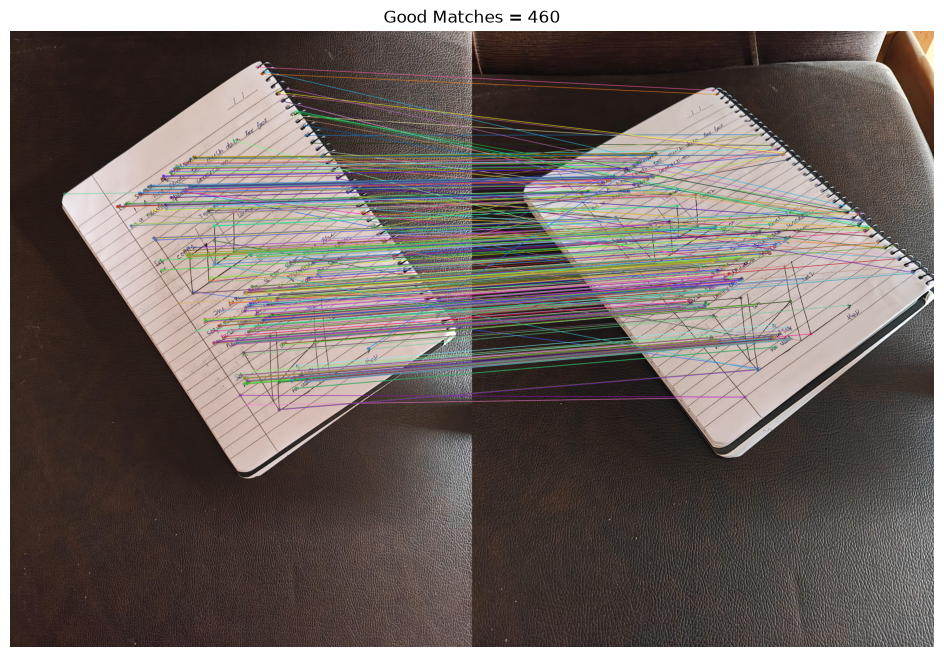

In [24]:
import cv2
import matplotlib.pyplot as plt
import os

os.makedirs("outputs", exist_ok=True)

# Read images
img1 = cv2.imread("raw_captures/handwritten_top_view.jpeg")
img2 = cv2.imread("raw_captures/handwritten_angled_view.jpeg")

if img1 is None or img2 is None:
    raise FileNotFoundError("One or both images not found.")

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# ORB detector
orb = cv2.ORB_create(nfeatures=3000)

kp1, des1 = orb.detectAndCompute(gray1, None)
kp2, des2 = orb.detectAndCompute(gray2, None)

print("Keypoints in Image 1:", len(kp1))
print("Keypoints in Image 2:", len(kp2))

# BF Matcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

matches = bf.knnMatch(des1, des2, k=2)

# Lowe's ratio test
good_matches = []

for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

print("Good Matches:", len(good_matches))

# Draw matches
matched = cv2.drawMatches(
    img1,
    kp1,
    img2,
    kp2,
    good_matches,
    None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

cv2.imwrite("outputs/task7_matches.jpg", matched)

plt.figure(figsize=(18,8))
plt.imshow(cv2.cvtColor(matched, cv2.COLOR_BGR2RGB))
plt.title(f"Good Matches = {len(good_matches)}")
plt.axis("off")
plt.show()

# Task 8. Face Detection   

Run a Haar cascade face detector on your normal-light photo. If it misses a face or throws a false positive, zoom into that region and explain, from what you can see in the pixels (lighting, angle, occlusion), why you think the detector struggled there.

Faces Detected: 1


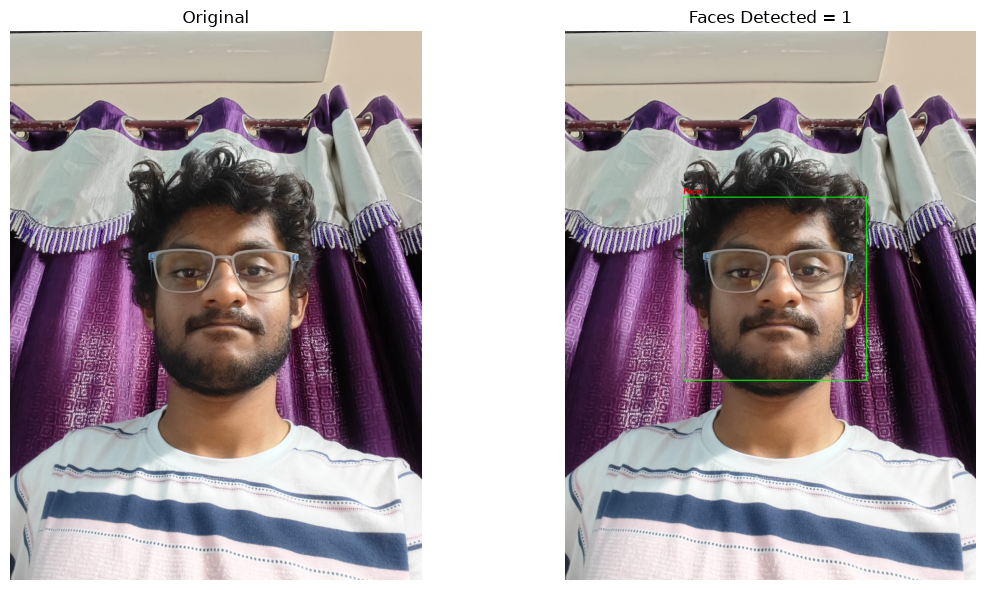

In [25]:
import cv2
import matplotlib.pyplot as plt
import os

# ---------------------------------------
# Create output folder
# ---------------------------------------
os.makedirs("outputs", exist_ok=True)

# ---------------------------------------
# Load image
# ---------------------------------------
img = cv2.imread("raw_captures/good_lighting.jpeg")

if img is None:
    raise FileNotFoundError("good_lighting.jpeg not found.")

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# ---------------------------------------
# Load Haar Cascade
# ---------------------------------------
cascade_path = cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
face_cascade = cv2.CascadeClassifier(cascade_path)

# ---------------------------------------
# Detect Faces
# ---------------------------------------
faces = face_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=5,
    minSize=(40, 40)
)

print("Faces Detected:", len(faces))

annotated = img.copy()

# ---------------------------------------
# Draw Face Rectangles
# ---------------------------------------
for i, (x, y, w, h) in enumerate(faces, start=1):
    cv2.rectangle(annotated, (x, y), (x+w, y+h), (0, 255, 0), 2)
    cv2.putText(
        annotated,
        f"Face {i}",
        (x, y-10),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.7,
        (0, 0, 255),
        2
    )

# ---------------------------------------
# Save annotated image
# ---------------------------------------
cv2.imwrite("outputs/face_detection.jpg", annotated)

# ---------------------------------------
# If at least one face is found,
# save a zoomed crop of the first face
# ---------------------------------------
if len(faces) > 0:
    x, y, w, h = faces[0]
    pad = 20

    x1 = max(0, x-pad)
    y1 = max(0, y-pad)
    x2 = min(img.shape[1], x+w+pad)
    y2 = min(img.shape[0], y+h+pad)

    face_crop = img[y1:y2, x1:x2]
    cv2.imwrite("outputs/face_crop.jpg", face_crop)

# ---------------------------------------
# Display
# ---------------------------------------
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.title(f"Faces Detected = {len(faces)}")
plt.axis("off")

plt.tight_layout()
plt.savefig("outputs/task8_results.png", dpi=300)
plt.show()

# Task 9. Real-Time Video Processing   

Using your short video clip, apply a real-time effect of your choice frame by frame (grayscale, edge detection, face detection, or a color filter) and save the output with cv2.VideoWriter. Screen-record yourself running it, not just the final clean output, and note one bug you hit along the way and how you fixed it.

In [29]:
import cv2
import os

# ---------------------------------------
# Create output folder
# ---------------------------------------
os.makedirs("outputs", exist_ok=True)

# ---------------------------------------
# Input Video
# ---------------------------------------
video_path = "raw_captures/street.mp4"

cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    raise FileNotFoundError("Unable to open video!")

# ---------------------------------------
# Video Properties
# ---------------------------------------
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

if fps == 0:
    fps = 20  # fallback

# ---------------------------------------
# Output Video Writer
# ---------------------------------------
output_path = "outputs/grayscale_output.mp4"

fourcc = cv2.VideoWriter_fourcc(*'mp4v')

writer = cv2.VideoWriter(
    output_path,
    fourcc,
    fps,
    (width, height)
)

frame_count = 0

# ---------------------------------------
# Process Video Frame by Frame
# ---------------------------------------
while True:

    ret, frame = cap.read()

    if not ret:
        break

    frame_count += 1

    # Convert to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Convert back to BGR for VideoWriter
    gray_bgr = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)

    # Display
    cv2.imshow("Real-Time Grayscale Processing", gray)

    # Save frame
    writer.write(gray_bgr)

    # Press 'q' to quit early
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# ---------------------------------------
# Cleanup
# ---------------------------------------
cap.release()
writer.release()
cv2.destroyAllWindows()

print("--------------------------------")
print("Processing Completed")
print("Frames Processed :", frame_count)
print("Output Saved At :", output_path)
print("--------------------------------")

--------------------------------
Processing Completed
Frames Processed : 150
Output Saved At : outputs/grayscale_output.mp4
--------------------------------


# Task 10. Camera Calibration and Lens Undistortion   

Print or display a standard checkerboard calibration pattern (9x6 internal corners is common; plenty of printable versions online). Using the same phone or webcam camera each time, capture 12 to 15 photos of the checkerboard from different angles, distances, and tilts, making sure it fills different parts of the frame across the set. 

Run cv2.findChessboardCorners() on each image to locate the internal corners, refine them with cv2.cornerSubPix(), and feed the results into cv2.calibrateCamera() to compute the camera matrix and distortion coefficients. Report your computed focal lengths (fx, fy), principal point (cx, cy), and the overall reprojection error. 

Take one more photo with the same camera of an ordinary scene that has long straight lines near the frame edges (a doorway, a bookshelf, a window frame works well). Undistort it with cv2.undistort() using your computed parameters and compare the before and after. The lines that were curved near the edges should now look straight. 

This one is genuinely fiddly: corner detection will fail on some of your images (usually due to glare, blur, or the board being too small in frame), so expect to reshoot a few. Note in your write-up how many images you had to discard and why.

In [34]:
import cv2
import numpy as np
import glob
import os
import matplotlib.pyplot as plt

# ============================================================
# SETTINGS
# ============================================================

CHECKERBOARD = (8,10)   # Internal corners

image_folder = "calibration_images"
test_image = "raw_captures/doorway.jpg"

output_folder = "outputs"
os.makedirs(output_folder, exist_ok=True)

criteria = (
    cv2.TERM_CRITERIA_EPS +
    cv2.TERM_CRITERIA_MAX_ITER,
    30,
    0.001
)

# ============================================================
# OBJECT POINTS
# ============================================================

objp = np.zeros((CHECKERBOARD[0] * CHECKERBOARD[1], 3), np.float32)

objp[:, :2] = np.mgrid[
    0:CHECKERBOARD[0],
    0:CHECKERBOARD[1]
].T.reshape(-1, 2)

objpoints = []
imgpoints = []

# ============================================================
# READ IMAGES
# ============================================================

images = glob.glob(os.path.join(image_folder, "*"))

valid_images = 0
discarded_images = 0

print("=" * 60)
print("Detecting Checkerboard Corners")
print("=" * 60)

for fname in images:

    img = cv2.imread(fname)

    if img is None:
        continue

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ret, corners = cv2.findChessboardCorners(
        gray,
        CHECKERBOARD,
        None
    )

    if ret:

        valid_images += 1

        objpoints.append(objp)

        refined = cv2.cornerSubPix(
            gray,
            corners,
            (11, 11),
            (-1, -1),
            criteria
        )

        imgpoints.append(refined)

        draw = img.copy()

        cv2.drawChessboardCorners(
            draw,
            CHECKERBOARD,
            refined,
            ret
        )

        filename = os.path.basename(fname)

        cv2.imwrite(
            os.path.join(
                output_folder,
                "corners_" + filename
            ),
            draw
        )

        print(f"[OK] {filename}")

    else:

        discarded_images += 1

        print(f"[FAILED] {os.path.basename(fname)}")

print()

print("Valid Images     :", valid_images)
print("Discarded Images :", discarded_images)

# ============================================================
# CAMERA CALIBRATION
# ============================================================

ret, cameraMatrix, distCoeffs, rvecs, tvecs = cv2.calibrateCamera(
    objpoints,
    imgpoints,
    gray.shape[::-1],
    None,
    None
)

# ============================================================
# CAMERA PARAMETERS
# ============================================================

fx = cameraMatrix[0, 0]
fy = cameraMatrix[1, 1]

cx = cameraMatrix[0, 2]
cy = cameraMatrix[1, 2]

print("\n")
print("=" * 60)
print("Camera Matrix")
print("=" * 60)
print(cameraMatrix)

print("\n")
print("=" * 60)
print("Distortion Coefficients")
print("=" * 60)
print(distCoeffs)

print("\n")
print("=" * 60)
print("Intrinsic Parameters")
print("=" * 60)

print(f"fx = {fx:.3f}")
print(f"fy = {fy:.3f}")
print(f"cx = {cx:.3f}")
print(f"cy = {cy:.3f}")

# ============================================================
# REPROJECTION ERROR
# ============================================================

total_error = 0

for i in range(len(objpoints)):

    projected, _ = cv2.projectPoints(
        objpoints[i],
        rvecs[i],
        tvecs[i],
        cameraMatrix,
        distCoeffs
    )

    error = cv2.norm(
        imgpoints[i],
        projected,
        cv2.NORM_L2
    ) / len(projected)

    total_error += error

mean_error = total_error / len(objpoints)

print("\n")
print("=" * 60)
print("Mean Reprojection Error")
print("=" * 60)
print(mean_error)

# ============================================================
# SAVE PARAMETERS
# ============================================================

np.savez(
    os.path.join(output_folder, "camera_parameters.npz"),
    cameraMatrix=cameraMatrix,
    distCoeffs=distCoeffs
)

print("\nCamera parameters saved.")

# ============================================================
# UNDISTORT TEST IMAGE
# ============================================================

img = cv2.imread(test_image)

if img is None:
    print("\nTest image not found.")
    exit()

h, w = img.shape[:2]

newCameraMatrix, roi = cv2.getOptimalNewCameraMatrix(
    cameraMatrix,
    distCoeffs,
    (w, h),
    1,
    (w, h)
)

undistorted = cv2.undistort(
    img,
    cameraMatrix,
    distCoeffs,
    None,
    newCameraMatrix
)

x, y, w, h = roi

if w > 0 and h > 0:
    undistorted = undistorted[y:y+h, x:x+w]

cv2.imwrite(
    os.path.join(output_folder, "undistorted.jpg"),
    undistorted
)

# ============================================================
# DISPLAY
# ============================================================

plt.figure(figsize=(14,6))

plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(cv2.imread(test_image), cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
plt.title("Undistorted")
plt.axis("off")

plt.tight_layout()
plt.savefig(
    os.path.join(output_folder, "comparison.png"),
    dpi=300
)

plt.show()

print("\nFinished Successfully.")

Detecting Checkerboard Corners
[FAILED] img1.jpeg
[FAILED] img2.jpeg
[FAILED] img3.jpeg
[FAILED] img4.jpeg
[FAILED] img5.jpeg
[FAILED] img7.jpeg

Valid Images     : 0
Discarded Images : 6


error: OpenCV(4.11.0) D:\a\opencv-python\opencv-python\opencv\modules\calib3d\src\calibration.cpp:1379: error: (-215:Assertion failed) nimages > 0 in function 'cv::calibrateCameraRO'
